## Develop a function to extract all the input and output values for training 

In [9]:
import pandas as pd
import numpy as np
import pypsa

import matplotlib.pyplot as plt
import matplotlib.gridspec as grd
import matplotlib.cm as cm

from pathlib import Path

## Custom functions
%load_ext autoreload
%autoreload 2
from helper_functions import *

%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 4]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
year = "2014"
network_name = "elec_s_37_ec_lcopt_Co2L-3H.nc"

dir_root = Path("../") # go to root of git repo
dir_data = dir_root / "data"
dir_networks = dir_data /"networks"
dir_export= dir_data /"ml"


filename_solved = dir_networks/ "solved" / year/ "3M" / network_name
filename_unsolved = dir_networks/ "unsolved" / year / network_name
filename_inputs = dir_export / "input.P"
filename_outputs = dir_export / "output.P"

for fn in [filename_solved, filename_unsolved, filename_inputs, filename_outputs]:
    print(f"{fn}: {'Exists' if fn.exists() else 'Missing'}")

../data/networks/solved/2014/3M/elec_s_37_ec_lcopt_Co2L-3H.nc: Exists
../data/networks/unsolved/2014/elec_s_37_ec_lcopt_Co2L-3H.nc: Exists
../data/ml/input.P: Exists
../data/ml/output.P: Exists


In [3]:
n = pypsa.Network(filename_solved.as_posix())
nU = pypsa.Network(filename_unsolved.as_posix())

Importing PyPSA from older version of PyPSA than current version.
Please read the release notes at https://pypsa.readthedocs.io/en/latest/release_notes.html
carefully to prepare your network for import.
Currently used PyPSA version [0, 20, 1], imported network file PyPSA version [0, 19, 3].

INFO:pypsa.io:Imported network elec_s_37_ec_lcopt_Co2L-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
Importing PyPSA from older version of PyPSA than current version.
Please read the release notes at https://pypsa.readthedocs.io/en/latest/release_notes.html
carefully to prepare your network for import.
Currently used PyPSA version [0, 20, 1], imported network file PyPSA version [0, 19, 3].

INFO:pypsa.io:Imported network elec_s_37_ec_lcopt_Co2L-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


## Extract all time dependent variables

In [4]:
## 
n.components

{'Network': {'list_name': 'networks',
  'description': 'Container for all components and functions which act upon the whole network.',
  'type': nan,
  'attrs':                                                          type     unit  \
  attribute                                                                
  name                                                   string      NaN   
  snapshots                                list or pandas.Index      NaN   
  snapshot_weightings                          pandas.DataFrame   hours    
  investment_periods                               pandas.Index    years   
  investment_period_weightings                 pandas.DataFrame      NaN   
  now                                                       any      NaN   
  srid                                                  integer      NaN   
  buses                                        pandas.DataFrame      NaN   
  buses_t                       dictionary of pandas.DataFrames      NaN   
  lin

In [5]:
network_summary(n)

Time range
Min:  2014-01-01 00:00:00
Max:  2014-12-31 21:00:00
Range:  364 days 21:00:00
Frequency:  3H
Shape:  (2920,)
Buses


,v_nom,x,y,country,control,generator,type,carrier,unit,v_mag_pu_set,v_mag_pu_min,v_mag_pu_max,sub_network
Bus,,,,,,,,,,,,,
AL1 0,380.0,19.897914,41.587568,AL,Slack,AL1 0 offwind-ac,,AC,None,1.0,0.0,inf,
AT1 0,380.0,13.604274,47.549498,AT,PQ,,,AC,None,1.0,0.0,inf,
BA1 0,380.0,18.122704,43.811367,BA,PQ,,,AC,None,1.0,0.0,inf,
BE1 0,380.0,4.617461,50.818887,BE,PQ,,,AC,None,1.0,0.0,inf,
BG1 0,380.0,24.673671,42.765271,BG,PQ,,,AC,None,1.0,0.0,inf,


37 buses
Timeseries:
v_mag_pu_set         Empty
p                    Not-Empty
q                    Empty
v_mag_pu             Empty
v_ang                Not-Empty
marginal_price       Not-Empty
Generators


,p_nom_max,weight,p_nom,capital_cost,p_nom_min,marginal_cost,efficiency,p_nom_extendable,bus,carrier,...,start_up_cost,shut_down_cost,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
Generator,,,,,,,,,,,,,,,,,,,,,
AL1 0 offwind-ac,3.695647e+03,332.259513,0.000000,197163.860850,0.000000,0.025141,1.000,True,AL1 0,offwind-ac,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL1 0 oil,inf,0.000000,89.854543,38234.561404,89.854543,130.236078,0.393,False,AL1 0,oil,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL1 0 onwind,6.748682e+04,1414.175585,0.000000,109295.569252,0.000000,0.024422,1.000,True,AL1 0,onwind,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL1 0 ror,inf,48.200000,48.200000,270940.715283,0.000000,0.009747,0.900,False,AL1 0,ror,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0
AL1 0 solar,1.774730e+04,2460.496611,16.850000,55064.071419,16.850000,0.019490,1.000,True,AL1 0,solar,...,0.0,0.0,0,0,1,0,NaN,NaN,1.0,1.0


264 generators
Timeseries:
p_min_pu             Empty
p_max_pu             Not-Empty
p_set                Empty
q_set                Empty
marginal_cost        Empty
p                    Not-Empty
q                    Empty
status               Empty
mu_upper             Empty
mu_lower             Empty
mu_p_set             Empty
mu_ramp_limit_up     Empty
mu_ramp_limit_down   Empty
Loads


,bus,carrier,type,p_set,q_set,sign
Load,,,,,,
AL1 0,AL1 0,,,0.0,0.0,-1.0
AT1 0,AT1 0,,,0.0,0.0,-1.0
BA1 0,BA1 0,,,0.0,0.0,-1.0
BE1 0,BE1 0,,,0.0,0.0,-1.0
BG1 0,BG1 0,,,0.0,0.0,-1.0


37 generators
Timeseries:
p_set                Not-Empty
q_set                Empty
p                    Not-Empty
q                    Empty
Lines and links


,bus0,bus1,num_parallel,length,type,s_max_pu,s_nom,capital_cost,s_nom_extendable,s_nom_min,...,build_year,lifetime,terrain_factor,v_ang_min,v_ang_max,sub_network,x_pu,r_pu,g_pu,b_pu
Line,,,,,,,,,,,,,,,,,,,,,
1,AL1 0,GR1 0,1.000012,474.029281,Al/St 240/40 4-bundle 380.0,0.7,1698.102612,18058.160416,True,1698.102612,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
2,AL1 0,ME1 0,1.335190,186.359938,Al/St 240/40 4-bundle 380.0,0.7,2267.272739,7099.337588,True,2267.272739,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
3,AL1 0,MK1 0,0.000417,175.650433,Al/St 240/40 4-bundle 380.0,0.7,0.000000,6691.677958,True,0.000000,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
4,AL1 0,RS1 0,1.335257,359.657249,Al/St 240/40 4-bundle 380.0,0.7,2267.272739,13701.073742,True,2267.272739,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0
5,AT1 0,CH1 0,4.000012,518.769048,Al/St 240/40 4-bundle 380.0,0.7,6792.410447,19763.732949,True,6792.410447,...,0,inf,1.0,-inf,inf,,0.0,0.0,0.0,0.0


,bus0,bus1,carrier,geometry,length,p_nom,tags,under_construction,underground,p_min_pu,...,efficiency,build_year,lifetime,p_nom_max,p_set,p_max_pu,marginal_cost,terrain_factor,ramp_limit_up,ramp_limit_down
Link,,,,,,,,,,,,,,,,,,,,,
14811,IT1 0,GR1 0,DC,"LINESTRING(21.0892517161789 39.3174860744064,2...",1318.048922,500.0,,False,False,-1.0,...,1.0,0,inf,inf,0.0,1.0,0.0,1.0,NaN,NaN
5640,ES4 0,ES1 0,DC,"LINESTRING(2.48932993486183 39.561252379133,1....",667.695017,400.0,"""MW""=>""None"", ""TSO""=>""None"", ""oid""=>""32590"", ""...",False,False,-1.0,...,1.0,0,inf,inf,0.0,1.0,0.0,1.0,NaN,NaN
13589,IT1 0,IT3 0,DC,"LINESTRING(9.17009350125146 41.2967653544603,9...",588.787777,1000.0,,False,False,-1.0,...,1.0,0,inf,inf,0.0,1.0,0.0,1.0,NaN,NaN
14802,IT1 0,ME1 0,DC,"LINESTRING(14.0986517070226 42.4133438660838,1...",761.100093,0.0,,True,False,-1.0,...,1.0,0,inf,inf,0.0,1.0,0.0,1.0,NaN,NaN
14825,FR1 0,ES1 0,DC,"LINESTRING(2.98259070757654 42.2776059846425,2...",1084.721702,2000.0,,False,False,-1.0,...,1.0,0,inf,inf,0.0,1.0,0.0,1.0,NaN,NaN


52 lines and 37 links
Timeseries:
s_max_pu             Empty
p0                   Not-Empty
q0                   Empty
p1                   Not-Empty
q1                   Empty
mu_lower             Not-Empty
mu_upper             Not-Empty
Timeseries:
efficiency           Empty
p_set                Empty
p_min_pu             Empty
p_max_pu             Empty
marginal_cost        Empty
p0                   Not-Empty
p1                   Not-Empty
mu_lower             Not-Empty
mu_upper             Not-Empty
mu_p_set             Empty


In [6]:
n_keys=n.__dict__.keys()
print([k  for k in n_keys if "_t" != k[-2:]])

['name', 'pypsa_version', '_meta', '_snapshots', '_snapshot_weightings', '_investment_periods', '_investment_period_weightings', 'components', 'component_attrs', 'passive_one_port_components', 'standard_type_components', 'controllable_branch_components', 'controllable_one_port_components', 'passive_branch_components', 'one_port_components', 'branch_components', 'all_components', 'transformers', 'transformer_types', 'carriers', 'loads', 'shunt_impedances', 'buses', 'sub_networks', 'links', 'generators', 'line_types', 'storage_units', 'lines', 'stores', 'global_constraints', '_cCounter', '_multi_invest', '_xCounter', 'objective', 'objective_constant', 'srid']


In [7]:
keys_t_all =[k  for k in n_keys if "_t" == k[-2:]]
keys_t_all

['transformers_t',
 'transformer_types_t',
 'carriers_t',
 'loads_t',
 'shunt_impedances_t',
 'buses_t',
 'sub_networks_t',
 'links_t',
 'generators_t',
 'line_types_t',
 'storage_units_t',
 'lines_t',
 'stores_t',
 'global_constraints_t']

In [8]:
keys_t = [
    'generators_t',
    'links_t',
    'storage_units_t',
    'lines_t',
    'buses_t',
    'loads_t',
 ]
keys_t_empty  = [
    'carriers_t',
    'global_constraints_t',
    'line_types_t',
    'transformers_t',
    'stores_t',
    'shunt_impedances_t',
    'sub_networks_t',
    'transformer_types_t'
 ]

In [9]:
iDfs_t = network_get_nonempty_timeseries(n)

### Outputs

In [4]:
# filter the outputs only (manual)
iOutputs = [
 ('buses_t', 'p'),
 ('buses_t', 'v_ang'),
 ('buses_t', 'marginal_price'),
 ('generators_t', 'p'),
 ('storage_units_t', 'p'),
 ('storage_units_t', 'state_of_charge'),
 ('storage_units_t', 'spill'),
 ('lines_t', 'p0'),
 ('lines_t', 'p1'),
 ('lines_t', 'mu_lower'),
 ('lines_t', 'mu_upper'),
 ('links_t', 'p0'),
 ('links_t', 'p1'),
 ('links_t', 'mu_lower'),
 ('links_t', 'mu_upper'),
 ]
iOutputs_not = [
 ('storage_units_t', 'inflow'),
 ('storage_units_t', 'p_dispatch'),
 ('storage_units_t', 'p_store'),
('generators_t', 'p_max_pu'),
 ('loads_t', 'p_set'), # loads are identical
 ('loads_t', 'p'),
]

In [5]:
# output index
index_outputs=[(c,d,getattr(n,c)[d].shape[1]) for c,d in iOutputs]
index_outputs

[('buses_t', 'p', 37),
 ('buses_t', 'v_ang', 37),
 ('buses_t', 'marginal_price', 37),
 ('generators_t', 'p', 264),
 ('storage_units_t', 'p', 50),
 ('storage_units_t', 'state_of_charge', 50),
 ('storage_units_t', 'spill', 50),
 ('lines_t', 'p0', 52),
 ('lines_t', 'p1', 52),
 ('lines_t', 'mu_lower', 52),
 ('lines_t', 'mu_upper', 52),
 ('links_t', 'p0', 37),
 ('links_t', 'p1', 37),
 ('links_t', 'mu_lower', 37),
 ('links_t', 'mu_upper', 37)]

In [12]:
# output dims
input_dims = np.sum([getattr(n,c)[d].shape[1] for c,d in iOutputs])
print(input_dims)

881


In [10]:
df_outputs = n_extract_values(n,index_outputs)
display(df_outputs.shape)
columns_outputs = df_outputs.columns.values

(2920, 881)

In [14]:
df_outputs.loc[:,df_outputs.columns.str.startswith("buses:p")].describe()#.mean(axis=0).hist(bins=100)
# [(1e4>df_outputs.mean(axis=0).abs()) 
                        # & (df_outputs.mean(axis=0).abs()>1e1)].hist(bins=100)
# df_outputs.mean(axis=0)

,buses:p: AL1 0,buses:p: AT1 0,buses:p: BA1 0,buses:p: BE1 0,buses:p: BG1 0,buses:p: CH1 0,buses:p: CZ1 0,buses:p: DE1 0,buses:p: DK1 0,buses:p: DK2 0,...,buses:p: MK1 0,buses:p: NL1 0,buses:p: NO2 0,buses:p: PL1 0,buses:p: PT1 0,buses:p: RO1 0,buses:p: RS1 0,buses:p: SE2 0,buses:p: SI1 0,buses:p: SK1 0
count,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,...,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000
mean,306.926743,305.648611,-756.158243,975.264815,-1447.070651,3808.450313,-872.574568,-12905.634360,15831.789033,2272.716821,...,-816.177053,1035.149267,2368.285102,-10133.588787,-2866.056612,1484.035360,-2885.512206,-2501.656943,-457.733034,-864.080838
std,981.521736,3060.026282,714.158996,1806.128403,1289.565348,6891.599262,979.858514,8471.533828,17723.992306,4282.330029,...,298.710848,10680.358194,3025.549759,2254.341342,1850.055859,2012.649531,1285.082006,2581.852361,436.666029,430.350604
min,-750.369954,-9618.727073,-1926.304292,-7015.310273,-4665.356939,-10207.018163,-3719.463139,-37111.921198,-14397.427314,-3100.115126,...,-1472.096405,-12344.449098,-5153.137758,-14684.012440,-8428.775540,-3147.386093,-5918.822470,-12064.024807,-1337.487974,-2166.126011
25%,-411.875303,-1808.334561,-1370.553743,11.979012,-2323.225746,-1681.500176,-1615.869153,-18261.231764,1425.229141,-1630.595978,...,-1000.274248,-7155.650646,-97.121492,-11749.334443,-4090.148877,-111.040074,-3913.909345,-3966.032027,-764.513914,-1132.176490
50%,-66.008365,497.296539,-1045.391251,1194.397193,-1566.597282,1385.041520,-868.346343,-14020.338724,3174.140454,1053.407068,...,-851.150574,-4381.985086,3739.250845,-10547.109140,-3136.424337,1110.333614,-2960.532924,-1890.538730,-510.881496,-859.782189
75%,871.198799,2689.539783,21.652093,2160.819530,-834.339067,9027.719137,-141.813602,-8590.551006,33495.156983,6229.252378,...,-709.574182,8616.960268,4688.870361,-8557.534962,-1905.077636,2968.005559,-1836.431982,-522.311831,-224.510280,-578.995112
max,4085.700248,10180.985705,1714.340584,5737.149564,2910.209517,27522.457122,3632.201292,29434.424340,45158.307986,9653.987095,...,313.448472,28264.601361,5153.136864,-3147.641210,3978.420583,6259.589026,239.593026,4776.237851,1817.851466,829.273985


In [11]:
df_outputs.isna().sum()[df_outputs.isna().sum()!=0]

buses:v_ang: ES4 0    2184
buses:v_ang: GB0 0    2184
buses:v_ang: IT3 0    2184
dtype: int64

In [35]:
# drop_na
(df_outputs.columns.shape,
df_outputs.dropna(how='any',axis=1).columns.shape)

((881,), (878,))

### Inputs

#### Time independent

In [16]:
[
# 'name',  
# 'pypsa_version',
# '_meta',
# '_snapshots',
# '_snapshot_weightings',
# '_investment_periods',
# '_investment_period_weightings',
'components',
'component_attrs',
'controllable_branch_components',
'standard_type_components',
'controllable_one_port_components',
'passive_branch_components',
'passive_one_port_components',
'one_port_components',
'branch_components',
'all_components',
'generators',
'carriers',
'links',
'storage_units',
'lines',
'global_constraints',
'line_types',
'buses',
'transformers',
'stores',
'shunt_impedances',
'sub_networks',
'loads',
'transformer_types',
'_cCounter',
'_multi_invest',
'_xCounter',
'objective',
'objective_constant',
'srid']

['components',
 'component_attrs',
 'controllable_branch_components',
 'standard_type_components',
 'controllable_one_port_components',
 'passive_branch_components',
 'passive_one_port_components',
 'one_port_components',
 'branch_components',
 'all_components',
 'generators',
 'carriers',
 'links',
 'storage_units',
 'lines',
 'global_constraints',
 'line_types',
 'buses',
 'transformers',
 'stores',
 'shunt_impedances',
 'sub_networks',
 'loads',
 'transformer_types',
 '_cCounter',
 '_multi_invest',
 '_xCounter',
 'objective',
 'objective_constant',
 'srid']

#### Time dependent

In [17]:
nU.components

{'Network': {'list_name': 'networks',
  'description': 'Container for all components and functions which act upon the whole network.',
  'type': nan,
  'attrs':                                                          type     unit  \
  attribute                                                                
  name                                                   string      NaN   
  snapshots                                list or pandas.Index      NaN   
  snapshot_weightings                          pandas.DataFrame   hours    
  investment_periods                               pandas.Index    years   
  investment_period_weightings                 pandas.DataFrame      NaN   
  now                                                       any      NaN   
  srid                                                  integer      NaN   
  buses                                        pandas.DataFrame      NaN   
  buses_t                       dictionary of pandas.DataFrames      NaN   
  lin

In [1]:
iInputsT = network_get_nonempty_timeseries(nU)

NameError: name 'network_get_nonempty_timeseries' is not defined

In [18]:
## Inputs T index
iInputsT = network_get_nonempty_timeseries(nU)
index_inputs=[(c,d,getattr(n,c)[d].shape[1]) for c,d in iInputsT]
index_inputs

[('loads_t', 'p_set', 37),
 ('generators_t', 'p_max_pu', 155),
 ('storage_units_t', 'inflow', 27)]

In [19]:
# Dimensions
input_dims = np.sum([getattr(nU,c)[d].shape[1] for c,d in iInputsT])
print(input_dims)

219


In [20]:
df_inputs = n_extract_values(nU,index_inputs)

In [21]:
df_inputs.columns.values

array(['loads:p_set: AL1 0', 'loads:p_set: AT1 0', 'loads:p_set: BA1 0',
       'loads:p_set: BE1 0', 'loads:p_set: BG1 0', 'loads:p_set: CH1 0',
       'loads:p_set: CZ1 0', 'loads:p_set: DE1 0', 'loads:p_set: DK1 0',
       'loads:p_set: DK2 0', 'loads:p_set: EE6 0', 'loads:p_set: ES1 0',
       'loads:p_set: ES4 0', 'loads:p_set: FI2 0', 'loads:p_set: FR1 0',
       'loads:p_set: GB0 0', 'loads:p_set: GB5 0', 'loads:p_set: GR1 0',
       'loads:p_set: HR1 0', 'loads:p_set: HU1 0', 'loads:p_set: IE5 0',
       'loads:p_set: IT1 0', 'loads:p_set: IT3 0', 'loads:p_set: LT6 0',
       'loads:p_set: LU1 0', 'loads:p_set: LV6 0', 'loads:p_set: ME1 0',
       'loads:p_set: MK1 0', 'loads:p_set: NL1 0', 'loads:p_set: NO2 0',
       'loads:p_set: PL1 0', 'loads:p_set: PT1 0', 'loads:p_set: RO1 0',
       'loads:p_set: RS1 0', 'loads:p_set: SE2 0', 'loads:p_set: SI1 0',
       'loads:p_set: SK1 0', 'generators:p_max_pu: AL1 0 offwind-ac',
       'generators:p_max_pu: AL1 0 onwind',
       'ge

## Export

In [22]:
df_inputs.to_pickle(filename_inputs)
df_outputs.to_pickle(filename_outputs)
df_outputs.loc[:,df_outputs.columns.str.startswith("buses:p:")
           ].to_pickle(dir_export/"output_p.P")

## Plots

#### Inputs plot

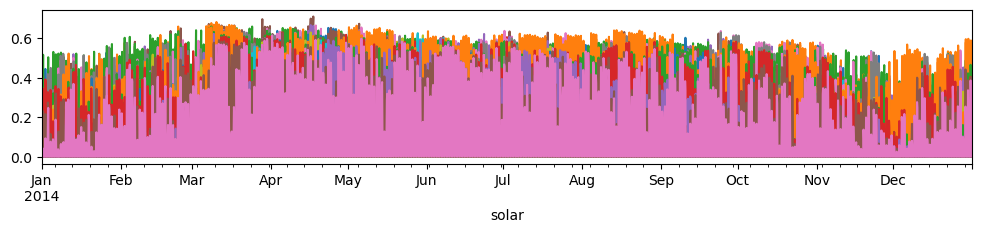

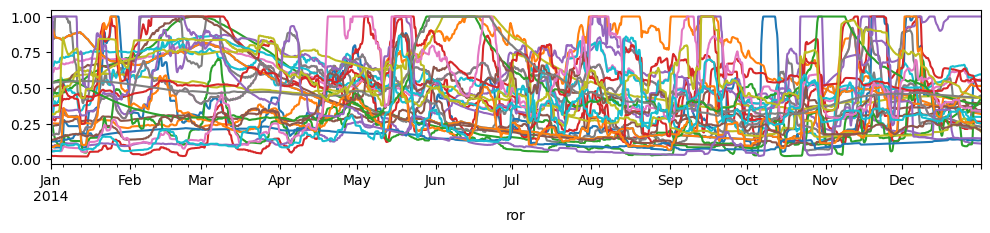

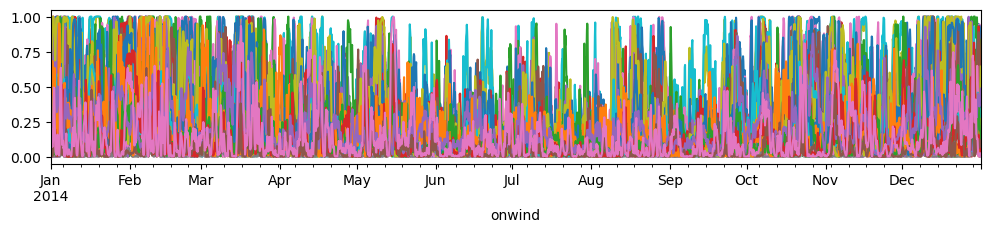

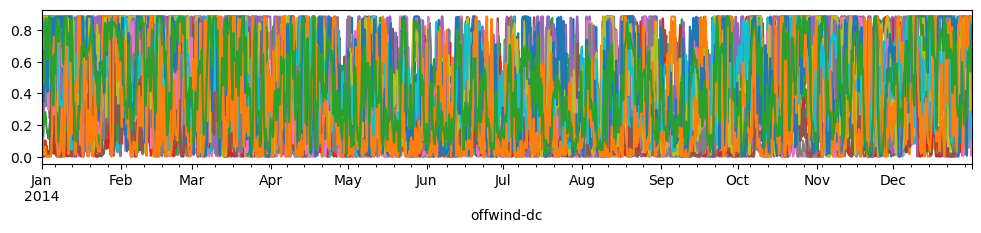

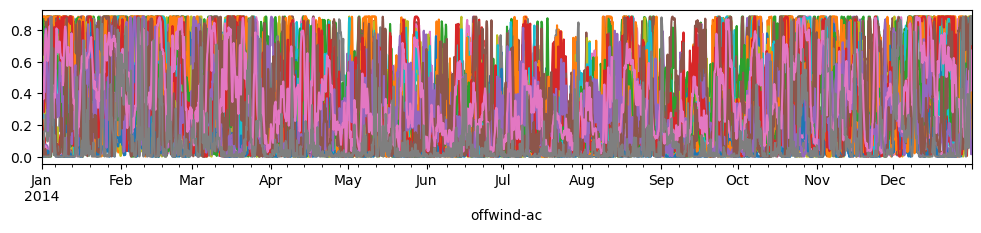

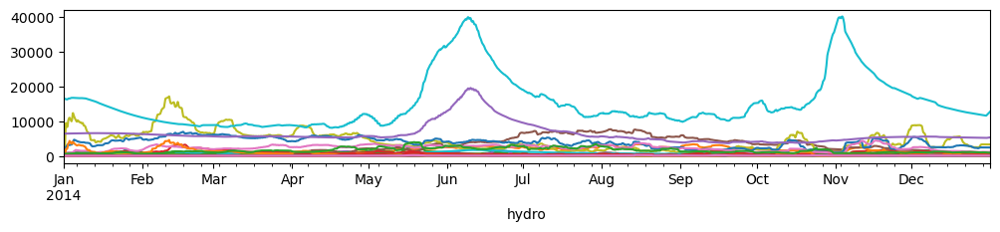

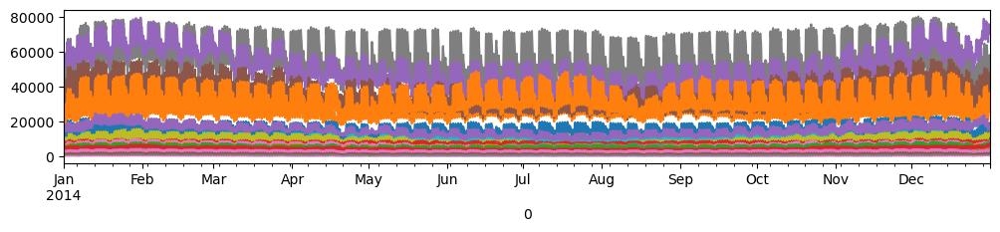

In [23]:
plt.rcParams['figure.figsize'] = [12, 2]
plt.rcParams['figure.dpi'] = 100
for val in ["solar","ror","onwind","offwind-dc","offwind-ac","hydro","0"]:
    df_inputs.loc[:,df_inputs.columns.str.endswith(val)].plot(legend=False).set_xlabel(val)

#### Outputs plot

Text(0.5, 0, 'Power')

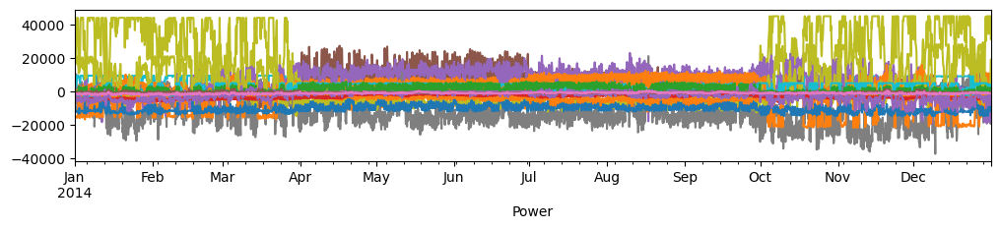

In [24]:
df_outputs.loc[:,df_outputs.columns.str.startswith("buses:p")].plot(legend=False).set_xlabel("Power")

## Test how many independent time dependent values

### PCA

In [25]:
from sklearn.decomposition import PCA
## array check number of linearly independent variables

In [26]:
X= df_outputs.drop(["buses:v_ang: ES4 0","buses:v_ang: IT3 0","buses:v_ang: GB0 0"],axis=1).values
pca = PCA(n_components =X.shape[1],whiten=True)
pca.fit(X)


PCA(n_components=878, whiten=True)

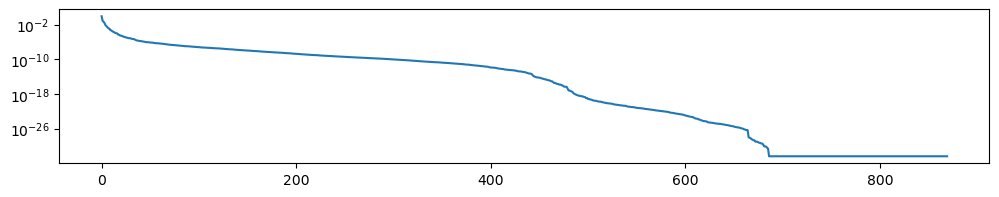

In [27]:
plt.plot(pca.explained_variance_ratio_[:870])
plt.yscale("log")

In [28]:
pca.components_.shape

(878, 878)

In [29]:
# a = np.array([x for _,_,x in index_outputs ])
# a[1]-=3
# x_ticks_minor = a.cumsum()

# x_labels_major = list(pd.DataFrame(index_outputs)[0].unique())
# b = pd.DataFrame(index_outputs).groupby(0)[2].sum()[x_labels_major].values
# b[0]-=3
# x_ticks_major = b.cumsum()
# x_labels_minor = [ f"{x[:-2]}:{y}"  for x,y,_ in index_outputs]
a = np.array([x for _,_,x in index_outputs ])
a[1]-=3
x_ticks_major = a.cumsum()
x_ticks_minor = x_ticks_major - a/2

# x_labels_major = list(pd.DataFrame(index_outputs)[0].unique())
# b = pd.DataFrame(index_outputs).groupby(0)[2].sum()[x_labels_major].values
# b[0]-=3
# x_ticks_major = b.cumsum()
x_labels_major = [ f"{x[:-2]}:{y} ⇥"  for x,y,_ in index_outputs] #⇥

In [30]:
pca.explained_variance_ratio_.min()

3.93341952602388e-37

/tmp/ipykernel_245565/2458566875.py:16: RuntimeWarning: divide by zero encountered in log
  ax[0].imshow(np.log(np.abs(pca.components_))[:N], cmap=cmap, vmin=-10, aspect='auto')


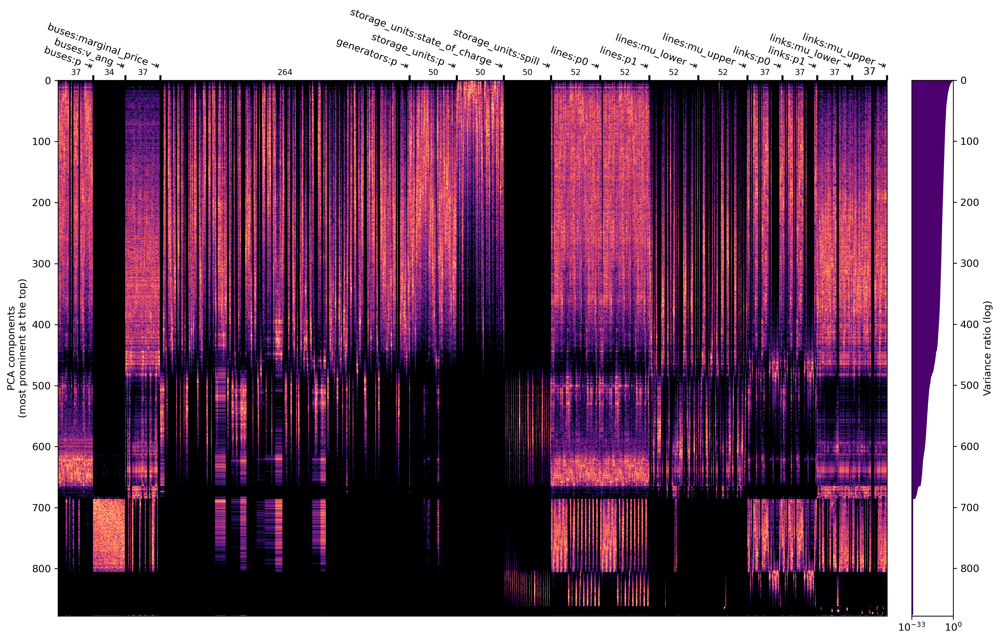

In [31]:
plt.rcParams['figure.dpi'] = 300
N=pca.n_components_
# N=300
fig = plt.figure(figsize=(14,9))

# create a 1 X 2 grid 
gs = grd.GridSpec(1, 2, width_ratios=[20,1])#, wspace=0.1)

# image plot
ax = [plt.subplot(g) for g in gs]


# fig,ax = plt.subplots(1,2,gridspec_kw=dict(width_ratios=[9,1]),figsize=(10,9),sharey='all')
cmap =  cm.magma
cmap.set_bad('k',1.)
ax[0].imshow(np.log(np.abs(pca.components_))[:N], cmap=cmap, vmin=-10, aspect='auto')
ax[0].xaxis.tick_top()
ax[0].set_xticks(x_ticks_minor, minor=True)
ax[0].set_xticklabels(a, minor=True,size=8)

ax[0].set_xticks(x_ticks_major, minor=False)
ax[0].set_xticklabels(x_labels_major, minor=False,rotation=-20)
for label in ax[0].get_xticklabels():
    label.set_horizontalalignment('right')
ax[0].set_ylabel("PCA components\n(most prominent at the top)")
ax[0].tick_params('x', length=5, width=2, which='major')
ax[0].tick_params('x', length=0, width=1, which='minor')


ax[1].fill_betweenx(np.arange(N),1e-33,pca.explained_variance_ratio_[:N],
              color ='xkcd:royal purple')
ax[1].set_xlim(1e-33,1e0)
ax[1].set_xscale('log')
ax[1].set_xticks([1e-33,1e0])
ax[1].yaxis.tick_right()
ax[1].set_ylim(0,N)
ax[1].invert_yaxis()
ax[1].set_ylabel('Variance ratio (log)')
ax[1].yaxis.set_label_position("right")
fig.tight_layout()
# fig.savefig("outputs_PCA_all.png")

### SVD

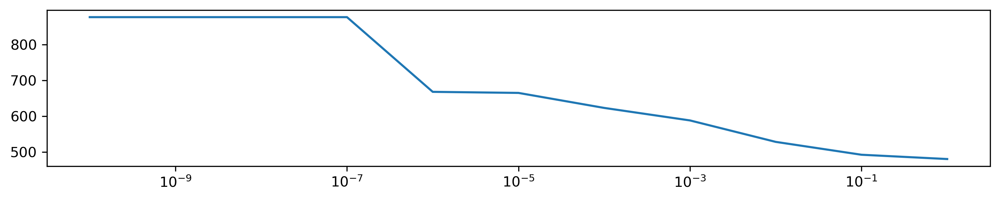

In [32]:
u,s,vh = np.linalg.svd(X)
rank_thresholds = np.logspace(-10,0,11)
plt.plot(rank_thresholds,(s[...,None]>rank_thresholds).sum(axis=0))
plt.xscale("log")

In [33]:
np.linalg.matrix_rank(X)

576